# Crime à San Francisco

In [1]:
import pandas
import matplotlib.pyplot as plt
data = pandas.read_csv('SanFrancisco.csv', sep=';', encoding = 'latin-1')
data.head()

,IncidntNum,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,Address,X,Y,Location,PdId
0,160919032,VANDALISM,"MALICIOUS MISCHIEF, VANDALISM OF VEHICLES",Friday,11/11/2016 00:00,07:00,MISSION,NONE,1400 Block of UTAH ST,-122.405252,37.751525,"(37.75152495730467, -122.40525176586286)","1,60919E+13"
1,160920976,ASSAULT,THREATS AGAINST LIFE,Saturday,11/12/2016 00:00,02:58,CENTRAL,"ARREST, BOOKED",2600 Block of MASON ST,-122.414003,37.807969,"(37.80796947292687, -122.41400317832917)","1,60921E+13"
2,160949114,LARCENY/THEFT,GRAND THEFT PICKPOCKET,Monday,11/21/2016 12:00:00 AM,09:40,NORTHERN,NONE,FILLMORE ST / GEARY BL,-122.432915,37.784353,"(37.784353342656765, -122.4329146034938)","1,60949E+13"
3,166017365,LARCENY/THEFT,GRAND THEFT FROM UNLOCKED AUTO,Wednesday,01/20/2016 12:00:00 AM,16:00,TARAVAL,NONE,CAPITOL AV / OCEAN AV,-122.459212,37.724533,"(37.72453296099497, -122.45921241037463)","1,66017E+13"
4,166040297,LARCENY/THEFT,GRAND THEFT OF PROPERTY,Saturday,02/13/2016 12:00:00 AM,10:00,SOUTHERN,NONE,MARKET ST / SUTTER ST,-122.400316,37.790100,"(37.79009962736703, -122.40031605728647)","1,6604E+13"


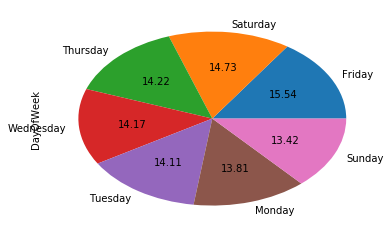

In [2]:
jour  = data['DayOfWeek'].value_counts()
jour.plot.pie(autopct='%.2f')
plt.show()

In [3]:
data['Category'].value_counts()

LARCENY/THEFT                  40449
OTHER OFFENSES                 19689
NON-CRIMINAL                   17919
ASSAULT                        13603
VANDALISM                       8595
VEHICLE THEFT                   6422
WARRANTS                        5974
BURGLARY                        5813
SUSPICIOUS OCC                  5802
MISSING PERSON                  4350
DRUG/NARCOTIC                   4246
ROBBERY                         3300
FRAUD                           2651
SECONDARY CODES                 1850
TRESPASS                        1813
WEAPON LAWS                     1659
SEX OFFENSES, FORCIBLE           951
STOLEN PROPERTY                  883
RECOVERED VEHICLE                736
DISORDERLY CONDUCT               659
PROSTITUTION                     642
FORGERY/COUNTERFEITING           625
DRUNKENNESS                      465
DRIVING UNDER THE INFLUENCE      378
ARSON                            286
KIDNAPPING                       258
EMBEZZLEMENT                     175
L

In [4]:
data['Resolution'].value_counts()

NONE                                      108086
ARREST, BOOKED                             39507
UNFOUNDED                                   1614
JUVENILE BOOKED                             1036
EXCEPTIONAL CLEARANCE                        371
ARREST, CITED                                144
CLEARED-CONTACT JUVENILE FOR MORE INFO        58
NOT PROSECUTED                                22
LOCATED                                       20
PSYCHOPATHIC CASE                             17
JUVENILE CITED                                 3
COMPLAINANT REFUSES TO PROSECUTE               2
JUVENILE DIVERTED                              2
PROSECUTED BY OUTSIDE AGENCY                   1
Name: Resolution, dtype: int64

In [5]:
data['PdDistrict'].value_counts()


SOUTHERN      28538
NORTHERN      20143
MISSION       19561
CENTRAL       17695
BAYVIEW       14344
INGLESIDE     11626
TARAVAL       11358
TENDERLOIN     9957
RICHMOND       8942
PARK           8718
Name: PdDistrict, dtype: int64

In [6]:
import folium
from folium.plugins import MarkerCluster


x_moy = data['X'].mean()
y_moy = data['Y'].mean()

# Attention X = longitude et Y = latitude
# creation d'une carte avec pour centre le point (x_moy,y_moy)
carte = folium.Map(location=[y_moy,x_moy],zoom_start=12,tiles='Stamen Terrain')

marker_cluster = MarkerCluster().add_to(carte)

vandalism = data.query('Category == "VANDALISM"')

for k in vandalism.index.values:
    latitude = data.loc[k,'Y']
    longitude = data.loc[k,'X']
    point = folium.Marker([latitude,longitude]).add_to(marker_cluster)
        
carte

In [7]:
from folium.plugins import HeatMap
carte2 = folium.Map(location=[y_moy,x_moy],zoom_start=12,tiles='Stamen Terrain')

L=[]
for k in vandalism.index.values:
    latitude = data.loc[k,'Y']
    longitude = data.loc[k,'X']
    L.append((latitude,longitude))

HeatMap(L, radius = 10, blur = 0).add_to(carte2)
    
        
carte2

# Accidents de voiture  en UK en 2016

In [14]:
import matplotlib.pyplot as plt
import pandas
import folium
from folium.plugins import HeatMap

data = pandas.read_csv('CarAccidentUk2016.csv', sep=';')

data = data.dropna(how = 'any') 

x_moy = data['Latitude'].mean()
y_moy = data['Longitude'].mean()

# creation d'une carte avec pour centre le point (x_moy,y_moy)
carte = folium.Map(location=[x_moy,y_moy],zoom_start=6)

L=[]
for k in data.index.values:
    latitude = data.loc[k,'Latitude']
    longitude = data.loc[k,'Longitude']
    L.append((latitude,longitude))

HeatMap(L, radius =  10, blur = 0).add_to(carte)
    
carte

In [15]:
carte2 = folium.Map(location=[x_moy,y_moy],zoom_start=6)

grave = data.query('Number_of_Casualties>=4')

for k in grave.index.values:
    latitude = grave.loc[k,'Latitude']
    longitude = grave.loc[k,'Longitude']
    point = folium.CircleMarker([latitude,longitude],radius=2,color='red')
    carte2.add_child(point)  

carte2

# Accident France 2005-2016

In [40]:
import pandas
import folium

data = pandas.read_csv('AccidentsVoitureFrance2005_2016.csv', sep=';', encoding = 'latin-1')
 
data = data.dropna(how = 'any') 
data = data.query('NOM_REG == "Nouvelle-Aquitaine"')
data = data.query('tue_nb != "0"')
data = data.query('ANNEE == 2016')

data.dtypes
#data.head()

C:\Users\berho\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:2717: DtypeWarning: Columns (11,12,13,14,15,16,20) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


LIBELLE_JOUR              object
SEMAINE                    int64
mois                       int64
HEURE                      int64
ANNEE                      int64
dep                       object
current_city_code         object
latitude                 float64
longitude                float64
nbv                      float64
NOM_REG                   object
voiture_nb                object
deuxrouesmotorises_nb     object
velo_nb                   object
poidslourd_nb             object
vehiculeautre_nb          object
pietons_nb                object
indemne_nb                 int64
blesseleger_nb             int64
hospitalise_nb             int64
tue_nb                    object
dtype: object

In [35]:
x_moy = data['latitude'].mean()
y_moy = data['longitude'].mean()

carte = folium.Map(location=[x_moy,y_moy],zoom_start=6)

for k in data.index.values:
    latitude = data.loc[k,'latitude']
    longitude = data.loc[k,'longitude']
    point = folium.CircleMarker([latitude,longitude],radius=2,color='red')
    carte.add_child(point)  

carte

C:\Users\berho\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:2717: DtypeWarning: Columns (11,12,13,14,15,16,20) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


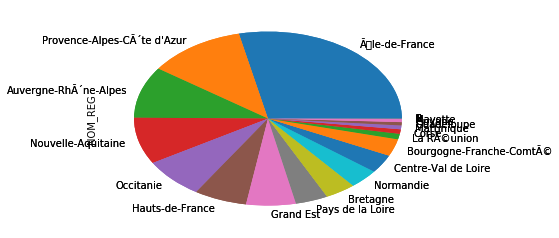

In [42]:
import matplotlib.pyplot as plt
data = pandas.read_csv('AccidentsVoitureFrance2005_2016.csv', sep=';', encoding = 'latin-1')
region = data['NOM_REG'].value_counts()
region.plot.pie()
plt.show()

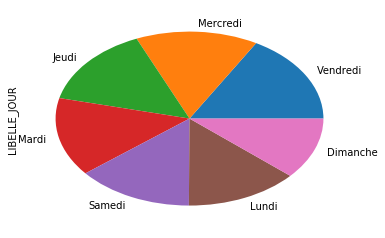

In [43]:
jour = data['LIBELLE_JOUR'].value_counts()
jour.plot.pie()
plt.show()

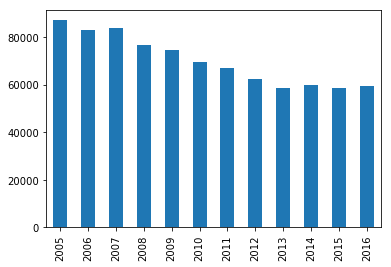

In [48]:
annee = data['ANNEE'].value_counts()
annee = annee.sort_index(axis = 0)
annee.plot.bar()
plt.show()

In [49]:
data['tue_nb'].sum()

TypeError: must be str, not int